In [1]:
import requests
import datetime
import json
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import folium
import plotly.express as px
from pprint import pprint
import googlemaps
from time import sleep

In [ ]:
#Fecha

t = datetime.datetime.now()
fecha = t.strftime('%d/%m/%Y')

# Descargas

In [2]:
API_KEY = #Your airtable api_key



airtable_base_url = "https://api.airtable.com/v0"


#Headers

headers = {"Authorization" : f"Bearer {API_KEY}",
           "Content-Type"  : "application/json"}


In [3]:
# Función general para la descarga de datos

def descargar_datos(lista_columnas):


    data_records = list()

    offset = None

    stop = False


    while stop == False:

        sleep(1.5)


        params = {"fields"      : None ,
                  "maxrecords"  : None,
                  "pageSize"    : 100,
                  "offset"      : offset}

        response = requests.get(url = endpoint, headers = headers, params = params)

        data = response.json()

        for i in data["records"]:


            lista_bucle = list()

            for key in lista_columnas:

                lista_bucle.append(i["fields"].get(key))

            data_records.append(lista_bucle)            


        try:
            offset = data["offset"]

        except:
            stop = True



    df = pd.DataFrame(data    = data_records,
                      columns = lista_columnas)

    return df

In [4]:
# Función para la descarga de datos del barril para usar normalize

def descargar_datos2(BASE_ID, TABLE_ID, offset = None):
    
    
    endpoint = f"{airtable_base_url}/{BASE_ID}/{TABLE_ID}"
    
    params = {"fields"      : None ,
              "maxrecords"  : None,
              "pageSize"    : 100,
              "offset"      : offset}

    response = requests.get(url = endpoint, headers = headers, params = params)

    data = response.json()
    
    return data
    

### Histórico Vigo

In [5]:
BASE_ID = # Your Base ID

TABLE_ID = # Your Table ID

#Endpoint

endpoint = f"{airtable_base_url}/{BASE_ID}/{TABLE_ID}"

In [6]:
columnas_df_historico_vigo_total = ["Fecha", "Dirección", "Precio Gasoleo A", "Precio Gasoleo Premium", "Precio Gasolina 95 E5",
                                     "Precio Gasolina 98 E5"]

In [7]:
df_hist_vigo_total = descargar_datos(columnas_df_historico_vigo_total)

In [8]:
df_hist_vigo_total.sort_values("Fecha").head(10)

,Fecha,Dirección,Precio Gasoleo A,Precio Gasoleo Premium,Precio Gasolina 95 E5,Precio Gasolina 98 E5
376,02/01/2023,"AVENIDA MADRID, S/N",1.629,1.699,1.567,1.689
581,02/01/2023,"CALLE TOMAS PAREDES, 6",1.709,1.779,1.639,1.769
578,02/01/2023,"CALLE RAMIRO PASCUAL, 18",1.759,1.809,1.689,1.829
495,02/01/2023,"CALLE REPUBLICA ARGENTINA, 8",1.739,1.799,1.699,1.899
576,02/01/2023,"CALLE ALCALDE LAVADORES, 64",1.659,NaN,1.588,1.699
283,02/01/2023,"AVDA. MADRID, 73",1.729,1.819,1.649,1.865
79,02/01/2023,"AVENIDA MADRID, 137",1.759,1.829,1.689,1.819
89,02/01/2023,"CALLE SAN ANDRES DE COMESAÑA, 16",1.739,1.809,1.689,1.839
512,02/01/2023,"AVENIDA BEIRAMAR, 53",1.779,1.868,1.767,1.929
94,02/01/2023,"AVENIDA DE MADRID, 66",1.759,1.829,1.689,1.819


## Precio Barril_petroleo_litro

In [9]:
BASE_ID = # Your Base ID

TABLE_ID = # Your Table ID

In [10]:
df_barril = pd.json_normalize(descargar_datos2(BASE_ID,TABLE_ID)["records"])
df_barril

,id,createdTime,fields.Fecha,fields.Precio_barril/litro
0,rec0HaFYskvf0bL3q,2022-12-22T07:42:36.000Z,13/12/2022,0.492744
1,rec2UNV6nYFnllE2r,2022-12-22T07:42:36.000Z,12/12/2022,0.471358
2,rec49LmCxWaShkUFA,2022-12-22T07:42:36.000Z,07/12/2022,0.485133
3,rec6RFpR8f8b6u20V,2022-12-22T07:42:36.000Z,19/12/2022,0.491297
4,rec9ucE3SW5x7yDVU,2022-12-22T07:43:55.000Z,20/12/2022,0.491423
5,recCg2GOOcaEEDH71,2022-12-22T07:42:40.000Z,05/12/2022,0.523061
6,recDl5mf9EGiqHnpZ,2022-12-22T07:42:43.000Z,21/11/2022,0.529476
7,recDyBPPqczeeNQ4S,2022-12-22T07:42:40.000Z,30/11/2022,0.522872
8,recEn3lKKsNCXvDOC,2022-12-22T07:42:36.000Z,15/12/2022,0.506141
9,recH7bnmrSuq2UxM9,2023-01-04T08:12:39.000Z,30/12/2022,0.511299


In [11]:
df_barril.drop(["id","createdTime"], axis = 1, inplace=True)

In [12]:
df_barril.columns = ['Fecha', 'Precio_barril_litro']

In [13]:
df_barril

,Fecha,Precio_barril_litro
0,13/12/2022,0.492744
1,12/12/2022,0.471358
2,07/12/2022,0.485133
3,19/12/2022,0.491297
4,20/12/2022,0.491423
5,05/12/2022,0.523061
6,21/11/2022,0.529476
7,30/11/2022,0.522872
8,15/12/2022,0.506141
9,30/12/2022,0.511299


### Dataframe global 

In [14]:
BASE_ID = # Your Base ID

TABLE_ID = # Your Table ID

#Endpoint

endpoint = f"{airtable_base_url}/{BASE_ID}/{TABLE_ID}"

In [15]:
columnas_df = ["C.P.", "Dirección", "Horario", "Latitud", "Localidad",
               "Longitud (WGS84)", "Municipio", "Precio Biodiesel", "Precio Bioetanol", 
               "Precio Gas Natural Comprimido", "Precio Gas Natural Licuado", "Precio Gases licuados del petróleo", "Precio Gasoleo A", 
               "Precio Gasoleo B", "Precio Gasoleo Premium", "Precio Gasolina 95 E10", "Precio Gasolina 95 E5",
               "Precio Gasolina 95 E5 Premium", "Precio Gasolina 98 E10", "Precio Gasolina 98 E5", 
               "Precio Hidrogeno", "Provincia", "Rótulo", "Tipo Venta", "% BioEtanol", "% Éster metílico",
               "IDEESS", "IDMunicipio", "IDProvincia", "IDCCAA"]

In [16]:
df = descargar_datos(columnas_df)

In [17]:
df

,C.P.,Dirección,Horario,Latitud,Localidad,Longitud (WGS84),Municipio,Precio Biodiesel,Precio Bioetanol,Precio Gas Natural Comprimido,...,Precio Hidrogeno,Provincia,Rótulo,Tipo Venta,% BioEtanol,% Éster metílico,IDEESS,IDMunicipio,IDProvincia,IDCCAA
0,13109,"CALLE CUATRO ESQUINAS ESQUINA LUIS SEVILLA, S/N",L-D: 24H,39.086583,PUEBLA DE DON RODRIGO,-4.616917,Puebla de Don Rodrigo,NaN,NaN,NaN,...,None,CIUDAD REAL,"MONTES NORTE ENERGETICOS, S.L.",P,"0,0","0,0",12706,2010,13,07
1,22365,"CARRETERA A138 KM. 72,200",L-D: 09:00-20:00,42.584167,SALINAS,0.212917,Tella-Sin,NaN,NaN,NaN,...,None,HUESCA,REPSOL,P,"0,0","0,0",1292,3471,22,02
2,16004,"AVENIDA REY JUAN CARLOS I (DEL), 30",L-D: 24H,40.055278,CUENCA,-2.126944,Cuenca,NaN,NaN,NaN,...,None,CUENCA,AUTONET&OIL,P,"0,0","0,0",13749,2283,16,07
3,29650,"AVENIDA AV. DE LA ENCARNACIÓN, S/N",L-D: 24H,36.535000,MIJAS,-4.633611,Mijas,NaN,NaN,NaN,...,None,MÁLAGA,CARREFOUR,P,"0,0","0,0",10019,4524,29,01
4,12190,"CARRETERA C.V 16 KM. 4,1",L-D: 06:00-22:00,40.014278,BORRIOL,-0.125833,Borriol,NaN,NaN,NaN,...,None,CASTELLÓN / CASTELLÓ,GALP,P,"0,0","0,0",3488,1834,12,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11836,29312,"DISEMINADO RIVERA RIO CEREZO, S/N",L: 08:00-18:00,36.992861,VILLANUEVA DEL ROSARIO,-4.369306,Villanueva del Rosario,NaN,NaN,NaN,...,None,MÁLAGA,SAN JUAN-V.ROSARIO,R,"0,0","0,0",11434,4551,29,01
11837,43300,"AVDA.DE REUS ESQUINA C/.KLAUS FISCHER, 2 (A.RE...",L-D: 24H,41.091528,MONT-ROIG DEL CAMP,0.965278,Mont-roig del Camp,NaN,NaN,NaN,...,None,TARRAGONA,GALP,P,"0,0","0,0",3308,6435,43,09
11838,25195,"CARRETERA 230 KM. 6,5",L-D: 24H,41.663917,BASSES D'ALPICAT (LES),0.606889,Lleida,NaN,NaN,1.789,...,None,LLEIDA,INCOENERGY,P,"0,0","0,0",15143,3916,25,09
11839,03013,"AVENIDA DENIA, 80",L-D: 24H,38.359278,ALICANTE/ALACANT,-0.466972,Alicante/Alacant,NaN,NaN,NaN,...,None,ALICANTE,BP SANDOVAL MD,P,"0,0","0,0",10940,152,03,10


### Histórico global 

In [18]:
BASE_ID = # Your Base ID

TABLE_ID = # Your Table ID

#Endpoint

endpoint = f"{airtable_base_url}/{BASE_ID}/{TABLE_ID}"

In [19]:
columnas_df_mediasglobales = ["Fecha", "Precio Gas Natural Comprimido", "Precio Gas Natural Licuado", 
                              "Precio Gases licuados del petróleo", "Precio Gasoleo A", "Precio Gasoleo B", 
                              "Precio Gasoleo Premium", "Precio Gasolina 95 E10", "Precio Gasolina 95 E5", 
                              "Precio Gasolina 95 E5 Premium", "Precio Gasolina 98 E10","Precio Gasolina 98 E5"]


In [20]:
df_mediasglobales = descargar_datos(columnas_df_mediasglobales)

In [21]:
df_mediasglobales

,Fecha,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 98 E10,Precio Gasolina 98 E5
0,24/12/2022,1.897197,1.812821,1.019998,1.637466,1.322445,1.732444,1.661182,1.561583,1.649714,1.765111,1.722200
1,05/01/2023,1.808961,1.681583,1.010733,1.676753,1.347222,1.773866,1.699792,1.612392,1.712509,1.760667,1.771564
2,30/12/2022,1.893181,1.807952,1.014910,1.655948,1.330607,1.755885,1.671864,1.579363,1.672860,1.757333,1.743507
3,20/12/2022,1.927762,1.878417,1.025033,1.648058,1.335148,1.741388,1.664136,1.571359,1.648974,1.767333,1.729522
4,27/12/2022,1.895228,1.811512,1.020104,1.638839,1.322270,1.734701,1.661864,1.563075,1.654559,1.759556,1.724094
5,02/01/2023,1.824717,1.703762,1.014958,1.668016,1.337644,1.767473,1.691000,1.595629,1.699369,1.761778,1.757513
6,21/12/2022,1.919929,1.875024,1.020651,1.643812,1.331463,1.737344,1.661636,1.566501,1.647373,1.767333,1.724723
7,19/12/2022,1.958627,1.937940,1.025269,1.652485,1.338941,1.746051,1.673182,1.578594,1.655038,1.767333,1.737338
8,17/12/2022,1.962675,1.944012,1.025710,1.657286,1.343524,1.751511,1.678636,1.585143,1.665833,1.771778,1.743854
9,22/12/2022,1.922213,1.864452,1.020576,1.639045,1.327141,1.732041,1.661636,1.562703,1.645717,1.767333,1.721483


# Datos y visualizaciones de interés para el propietario de una gasolinera

In [22]:
# Agrupamos por fecha y cálculamos la media de cada tipo de gasolína para el ejemplo en la provincia de vigo

df_medias_fecha = df_hist_vigo_total.groupby("Fecha", as_index=False).mean()

df_medias_fecha

,Fecha,Precio Gasoleo A,Precio Gasoleo Premium,Precio Gasolina 95 E5,Precio Gasolina 98 E5
0,02/01/2023,1.700697,1.806577,1.637212,1.817071
1,04/01/2023,1.708758,1.814808,1.653909,1.832821
2,05/01/2023,1.713061,1.816346,1.660636,1.838393
3,14/12/2022,1.706500,1.804385,1.634469,1.806036
4,15/12/2022,1.698625,1.797846,1.629469,1.802464
5,16/12/2022,1.692314,1.802536,1.625571,1.809067
6,17/12/2022,1.688875,1.797038,1.623938,1.801679
7,18/12/2022,1.685031,1.793192,1.619250,1.796607
8,19/12/2022,1.683031,1.788192,1.614000,1.792607
9,20/12/2022,1.675406,1.783192,1.603625,1.778750


In [23]:
# Preparamos el dato de los precios del día actual para el boxplot

df_precios_vigo_hoy = df_hist_vigo_total[df_hist_vigo_total["Fecha"] == fecha].iloc[:,2:]


# Cambiamos los NaN por la media de cada columna

for i in df_precios_vigo_hoy.columns:
    
    df_precios_vigo_hoy[i].replace({np.nan : df_precios_vigo_hoy[i].mean()}, inplace = True)
    
df_precios_vigo_hoy

,Precio Gasoleo A,Precio Gasoleo Premium,Precio Gasolina 95 E5,Precio Gasolina 98 E5
13,1.759000,1.819000,1.699000,1.889000
15,1.657000,1.717000,1.597000,1.747000
18,1.749000,1.839000,1.709000,1.859000
38,1.625000,1.816346,1.547000,1.838393
57,1.713061,1.816346,1.660636,1.838393
71,1.779000,1.868000,1.767000,1.929000
78,1.769000,1.829000,1.709000,1.859000
90,1.749000,1.819000,1.689000,1.839000
127,1.739000,1.809000,1.669000,1.799000
143,1.609000,1.816346,1.529000,1.838393


### Boxplot de los datos del día actual en la localidad de Vigo

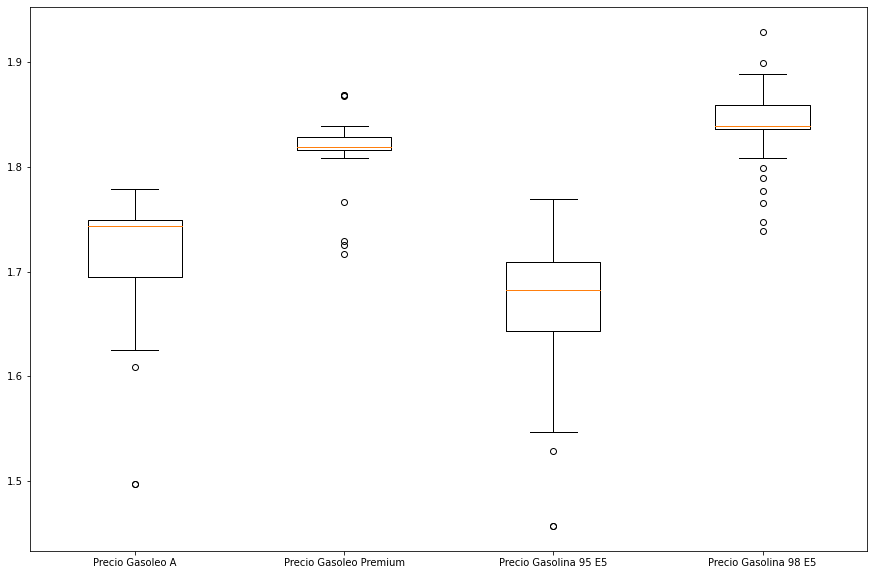

In [24]:
plt.figure(figsize=(15,10))

data = df_precios_vigo_hoy

etiquetas = df_precios_vigo_hoy.columns

plt.boxplot(x = data, labels = etiquetas, meanline=True)

plt.show()

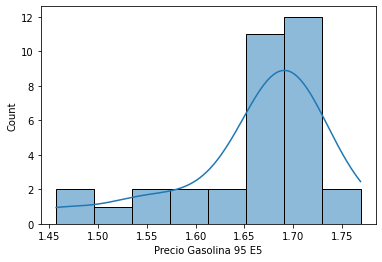

In [25]:
# distribucion precio gasolina

sns.histplot(df_precios_vigo_hoy["Precio Gasolina 95 E5"],  kde = True)

plt.show()

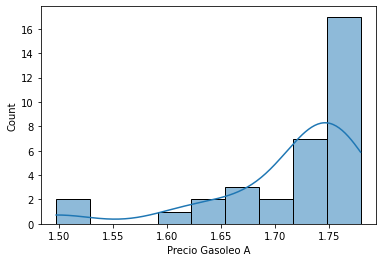

In [26]:
#Distribución precio diesel

sns.histplot(df_precios_vigo_hoy["Precio Gasoleo A"],  kde = True)

plt.show()

## Comparativa gasolinas - barril de petroleo

In [27]:
# Juntamos los datos de precio de gasolina y barril de petroleo de las fechas disponibles

df_barril_gasolinas = pd.merge(left = df_hist_vigo_total.groupby("Fecha", as_index=False).mean(), right = df_barril, left_on = "Fecha", right_on = "Fecha", how = "inner")

df_barril_gasolinas

,Fecha,Precio Gasoleo A,Precio Gasoleo Premium,Precio Gasolina 95 E5,Precio Gasolina 98 E5,Precio_barril_litro
0,14/12/2022,1.706500,1.804385,1.634469,1.806036,0.502996
1,15/12/2022,1.698625,1.797846,1.629469,1.802464,0.506141
2,16/12/2022,1.692314,1.802536,1.625571,1.809067,0.495197
3,19/12/2022,1.683031,1.788192,1.614000,1.792607,0.491297
4,20/12/2022,1.675406,1.783192,1.603625,1.778750,0.491423
5,21/12/2022,1.672906,1.782423,1.600812,1.776107,0.499159
6,22/12/2022,1.663125,1.766769,1.594344,1.769750,0.510355
7,22/12/2022,1.663125,1.766769,1.594344,1.769750,0.510355
8,30/12/2022,1.687000,1.797962,1.615030,1.798536,0.511299


### Heatmap para ver la correlación entre los distintos elementos

In [28]:
# No se aprecia correlación entre el precio del barril de petroleo debído a la escasez de datos y el pequeño desfase con el que operan.
# Se prevee que con la acumulación de datos históricos se podría realizar el estudio con más precisión

px.imshow(img = df_barril_gasolinas[1:].corr(), text_auto=True)

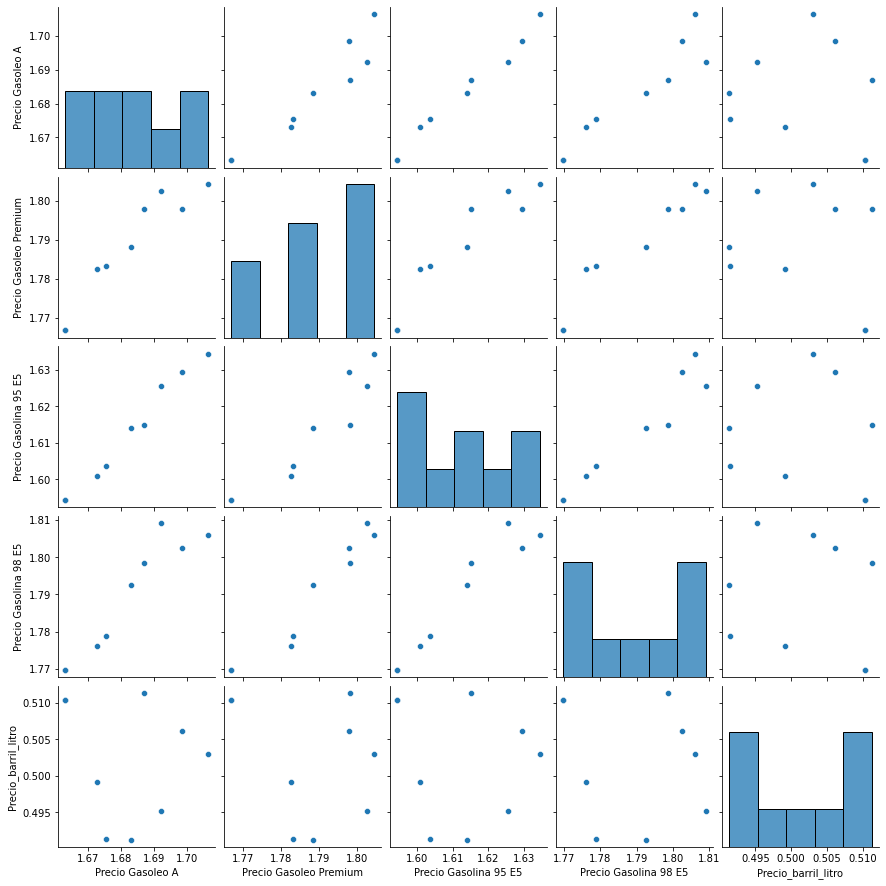

In [29]:
sns.pairplot(df_barril_gasolinas)
plt.show()

## Scatter plot para dibujar la comparativa Gasolina 95 - Barril de petroleo

<AxesSubplot:xlabel='Precio Gasolina 95 E5', ylabel='Precio_barril_litro'>

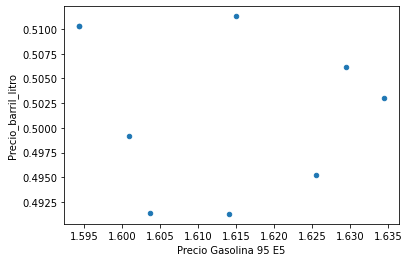

In [30]:
y = df_barril_gasolinas['Precio_barril_litro']
x = df_barril_gasolinas[['Precio Gasolina 95 E5']]

df_barril_gasolinas.plot(kind='scatter', x='Precio Gasolina 95 E5', y='Precio_barril_litro')

## Modelo predictivo del precio de la gasolina conforme al precio del barril

In [31]:
from sklearn import linear_model

lm = linear_model.LinearRegression()
lm.fit(x, y)

LinearRegression()

In [32]:
lm.score(x, y) 

0.028629814382515106

In [33]:
coef = lm.coef_[0]

In [34]:
intercept = lm.intercept_

In [35]:
y_pred = coef*x['Precio Gasolina 95 E5'] + intercept

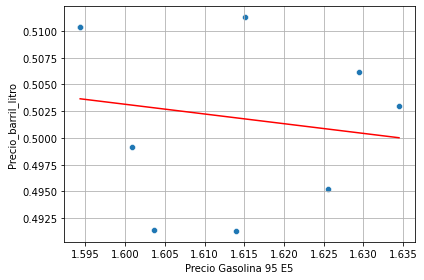

In [36]:
#graficar los puntos

plt.figure(figsize=(6,4), tight_layout=True)
sns.scatterplot(x=x['Precio Gasolina 95 E5'], y=y)

#graficar la linea

sns.lineplot(x=x['Precio Gasolina 95 E5'], y=y_pred, color='red')

#axis

plt.savefig('linear_regression')
plt.grid()
plt.show()

## Modelo predictivo del precio del diesel conforme al precio del barril

<AxesSubplot:xlabel='Precio Gasoleo A', ylabel='Precio_barril_litro'>

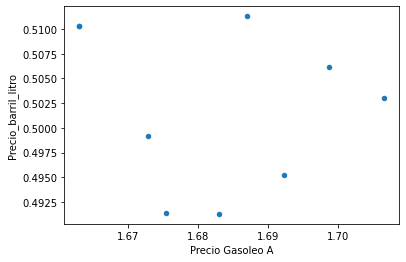

In [37]:
y = df_barril_gasolinas['Precio_barril_litro']
x = df_barril_gasolinas[['Precio Gasoleo A']]

df_barril_gasolinas.plot(kind = 'scatter', x = 'Precio Gasoleo A', y = 'Precio_barril_litro')

In [38]:
lm = linear_model.LinearRegression()
lm.fit(x, y)

LinearRegression()

In [39]:
lm.score(x, y) 

0.02687876225806274

In [40]:
coef = lm.coef_[0]

In [41]:
intercept = lm.intercept_

In [42]:
y_pred = coef*x['Precio Gasoleo A'] + intercept

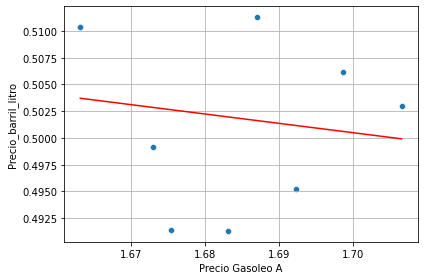

In [43]:
#graficar los puntos
plt.figure(figsize=(6,4), tight_layout=True)
sns.scatterplot(x=x['Precio Gasoleo A'], y=y)

#graficar la linea
sns.lineplot(x=x['Precio Gasoleo A'], y=y_pred, color='red')

#axis
#plt.xlim(0)
#plt.ylim(0)
plt.savefig('linear_regression')
plt.grid()
plt.show()

### Lineal de gasolinas - barril

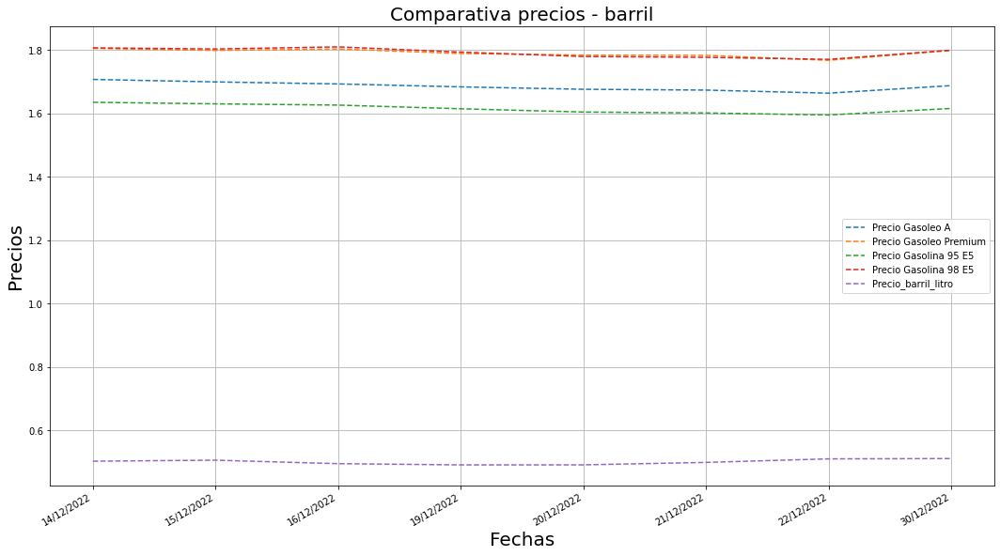

In [44]:
    # Tamaño de la figura
    plt.figure(figsize = (18, 10))

    # Plot (función especial que trabaja con fechas)
    
    for i in df_barril_gasolinas.columns[1:]:
        plt.plot_date(x = df_barril_gasolinas["Fecha"], y = df_barril_gasolinas[i], fmt = "--", label = i)


    # Evita que se sobrepongan las fechas
    plt.gcf().autofmt_xdate()

    # Etiquetas
    plt.legend()
    plt.xlabel("Fechas", fontsize = 20)
    plt.ylabel("Precios", fontsize = 20)
    plt.title("Comparativa precios - barril", fontsize = 20)

    plt.grid()
    plt.show()

### Lineal gasolinas 

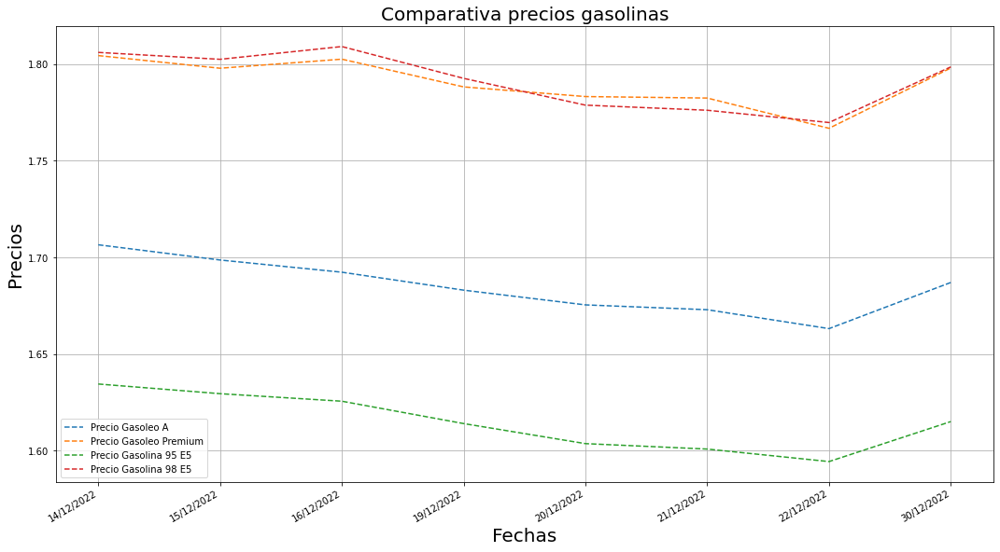

In [45]:
    # Tamaño de la figura
    plt.figure(figsize = (18, 10))

    # Plot (función especial que trabaja con fechas)
    
    for i in df_barril_gasolinas.columns[1:-1]:
        plt.plot_date(x = df_barril_gasolinas["Fecha"], y = df_barril_gasolinas[i], fmt = "--", label = i)


    # Evita que se sobrepongan las fechas
    plt.gcf().autofmt_xdate()

    # Etiquetas
    plt.legend()
    plt.xlabel("Fechas", fontsize = 20)
    plt.ylabel("Precios", fontsize = 20)
    plt.title("Comparativa precios gasolinas", fontsize = 20)

    plt.grid()
    plt.show()

# Datos y visualizaciones de interés para el conductor

### Tabla medias por provincia

In [46]:
df_medias = df.groupby("Provincia", as_index=False).mean().sort_values("Precio Gasolina 95 E5", ascending=False)

In [47]:
df_medias

,Provincia,Latitud,Longitud (WGS84),Precio Biodiesel,Precio Bioetanol,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 98 E10,Precio Gasolina 98 E5
6,BALEARS (ILLES),39.564274,2.841573,NaN,NaN,NaN,NaN,1.044150,1.710800,1.383667,1.779270,1.7640,1.613673,1.704656,NaN,1.766602
9,BURGOS,42.315706,-3.596194,NaN,NaN,1.781000,1.679750,1.024667,1.658353,1.306538,1.755358,NaN,1.612083,1.721000,NaN,1.783941
51,ÁVILA,40.645114,-4.798635,1.699000,NaN,NaN,NaN,1.074333,1.671703,1.375727,1.764000,NaN,1.602887,1.709000,NaN,1.783763
4,ASTURIAS,43.430593,-5.884743,NaN,1.969,1.816000,1.666000,1.074333,1.653582,1.346554,1.743353,1.8390,1.597822,1.657111,NaN,1.751145
38,RIOJA (LA),42.385828,-2.375996,NaN,NaN,2.074000,NaN,1.007000,1.656635,1.311576,1.744111,NaN,1.597800,1.709000,NaN,1.747846
23,HUELVA,37.388932,-6.879347,1.569000,NaN,NaN,1.735000,1.019000,1.673651,1.366914,1.766795,1.6090,1.596896,1.691222,1.717,1.762966
14,CORUÑA (A),43.159371,-8.466417,NaN,1.798,1.930000,1.718000,1.002133,1.663584,1.432409,1.749665,1.6915,1.596473,1.659667,NaN,1.788305
10,CANTABRIA,43.361469,-3.869408,1.779000,NaN,NaN,NaN,1.051087,1.662127,1.332353,1.761121,NaN,1.596296,1.696143,NaN,1.773851
49,ZAMORA,41.721606,-5.769722,NaN,NaN,1.766000,1.666000,1.009000,1.676542,1.276556,1.763224,NaN,1.594731,1.705667,NaN,1.751122
34,OURENSE,42.252503,-7.746945,NaN,NaN,1.930000,NaN,1.172200,1.673841,1.417533,1.765136,1.7440,1.594023,1.660667,NaN,1.767941


### Tabla medias por municipio

In [48]:
df_medias_municipio = df.groupby("Municipio", as_index=False).mean().sort_values("Precio Gasolina 95 E5", ascending=False)

In [49]:
df_medias_municipio

,Municipio,Latitud,Longitud (WGS84),Precio Biodiesel,Precio Bioetanol,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 98 E10,Precio Gasolina 98 E5
1888,Montseny,41.758611,2.396361,NaN,NaN,NaN,NaN,NaN,2.125,NaN,NaN,NaN,1.999,NaN,NaN,NaN
2676,Santa Cruz de Moya,39.967139,-1.262694,NaN,NaN,NaN,NaN,NaN,1.720,1.330,NaN,NaN,1.965,NaN,NaN,NaN
1163,Esparragalejo,38.941250,-6.429833,NaN,NaN,NaN,NaN,NaN,1.879,NaN,NaN,NaN,1.909,NaN,NaN,NaN
3097,Valle de la Serena,38.695278,-5.796278,NaN,NaN,NaN,NaN,NaN,1.899,1.619,NaN,NaN,1.869,NaN,NaN,NaN
129,Alcántara,39.714417,-6.883111,NaN,NaN,NaN,NaN,NaN,1.892,NaN,NaN,NaN,1.857,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3358,Visiedo,40.683278,-1.098417,NaN,NaN,NaN,NaN,NaN,NaN,1.355,NaN,NaN,NaN,NaN,NaN,NaN
3362,Viso del Marqués,38.519944,-3.557778,NaN,NaN,NaN,NaN,NaN,1.629,1.255,NaN,NaN,NaN,NaN,NaN,NaN
3388,Yerri,42.732361,-1.987972,NaN,NaN,NaN,NaN,NaN,1.615,1.264,NaN,NaN,NaN,NaN,NaN,NaN
3396,Zafarraya,36.966249,-4.139659,NaN,NaN,NaN,NaN,NaN,1.520,1.180,NaN,NaN,NaN,NaN,NaN,NaN


### Tabla medias por proveedor

In [50]:
def filtro_20proveedores(data = df):

    lista_rotulos = list(df.value_counts("Rótulo").index[:20])
    return df[df["Rótulo"].isin(lista_rotulos)]

In [51]:
df_rotulos = filtro_20proveedores()
df_rotulos_medias = df_rotulos.groupby("Rótulo", as_index=False).mean().sort_values("Precio Gasolina 95 E5", ascending=False)
df_rotulos_medias

,Rótulo,Latitud,Longitud (WGS84),Precio Biodiesel,Precio Bioetanol,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 98 E10,Precio Gasolina 98 E5
19,VALCARCE,41.832153,-5.107829,NaN,NaN,NaN,NaN,0.968667,1.699510,1.443680,1.763788,NaN,1.627000,NaN,1.699,1.788091
0,AGLA,37.434586,-4.865459,NaN,NaN,NaN,NaN,1.010750,1.657780,1.363654,1.730208,NaN,1.600420,NaN,NaN,1.810533
2,AVIA,42.050392,-3.207146,1.779,1.619,NaN,NaN,1.010375,1.673776,1.328278,1.750827,NaN,1.597155,NaN,1.839,1.754951
8,CEPSA,39.729838,-3.539342,NaN,NaN,2.331000,2.331000,1.036649,1.677761,1.370661,1.762904,1.68775,1.595597,1.678760,NaN,1.733355
13,PETRONOR,41.686942,-2.650678,NaN,NaN,1.898000,NaN,1.024846,1.677017,1.340203,1.754627,NaN,1.590813,1.603143,NaN,1.754589
5,BP,38.556432,-2.683712,NaN,NaN,NaN,NaN,1.086000,1.672867,1.347850,1.770508,NaN,1.586272,NaN,NaN,1.738470
17,REPSOL,40.053653,-3.188442,1.769,NaN,1.889067,1.761111,1.046250,1.671132,1.333914,1.751441,1.68200,1.583555,1.628638,NaN,1.739100
6,CAMPSA,40.172520,-4.108402,NaN,NaN,NaN,NaN,1.064333,1.668702,1.306933,1.751921,NaN,1.579530,1.579000,NaN,1.733073
7,CARREFOUR,39.631586,-2.963295,NaN,NaN,NaN,NaN,NaN,1.667944,NaN,1.708917,NaN,1.577741,NaN,NaN,1.733786
11,GALP,40.507833,-2.741773,NaN,NaN,1.827333,1.696500,1.025897,1.661102,1.363407,1.738205,NaN,1.576713,1.610400,NaN,1.725836


## Histórico precios globales

In [52]:
df_mediasglobales = df_mediasglobales.sort_values("Fecha")
df_mediasglobales

,Fecha,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 98 E10,Precio Gasolina 98 E5
5,02/01/2023,1.824717,1.703762,1.014958,1.668016,1.337644,1.767473,1.691000,1.595629,1.699369,1.761778,1.757513
17,04/01/2023,1.818109,1.688786,1.011430,1.675223,1.344940,1.773575,1.697136,1.608534,1.706634,1.760667,1.769102
1,05/01/2023,1.808961,1.681583,1.010733,1.676753,1.347222,1.773866,1.699792,1.612392,1.712509,1.760667,1.771564
10,14/12/2022,1.959032,1.935679,1.026316,1.663927,1.351132,1.756137,1.692043,1.596160,1.674889,1.774000,1.752330
15,15/12/2022,1.965373,1.944012,1.025639,1.661277,1.348984,1.754439,1.691727,1.593048,1.674221,1.774000,1.750222
12,16/12/2022,1.962675,1.944012,1.025385,1.659676,1.346815,1.756208,1.690000,1.590359,1.673985,1.771778,1.751295
8,17/12/2022,1.962675,1.944012,1.025710,1.657286,1.343524,1.751511,1.678636,1.585143,1.665833,1.771778,1.743854
16,18/12/2022,1.962675,1.944012,1.025698,1.654690,1.341294,1.748077,1.675909,1.581423,1.659224,1.771778,1.739543
7,19/12/2022,1.958627,1.937940,1.025269,1.652485,1.338941,1.746051,1.673182,1.578594,1.655038,1.767333,1.737338
3,20/12/2022,1.927762,1.878417,1.025033,1.648058,1.335148,1.741388,1.664136,1.571359,1.648974,1.767333,1.729522


## Gráfico lineal histórico de todos los tipos de combustible

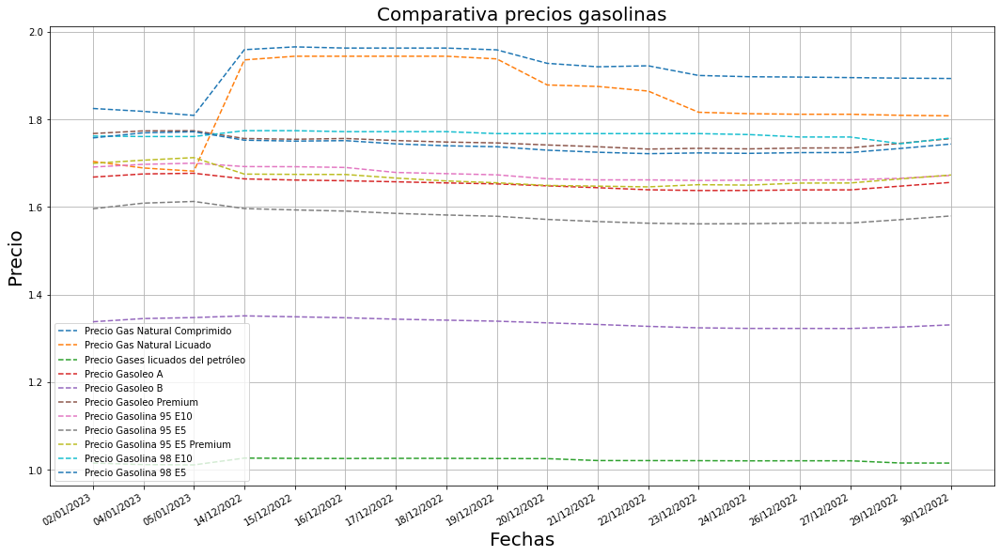

In [53]:
# Tamaño de la figura
plt.figure(figsize = (18, 10))

for i in df_mediasglobales.columns[1:]:
    plt.plot_date(x = df_mediasglobales["Fecha"], y = df_mediasglobales[i], fmt = "--", label = i)


# Evita que se sobrepongan las fechas
plt.gcf().autofmt_xdate()

# Etiquetas
plt.legend()
plt.xlabel("Fechas", fontsize = 20)
plt.ylabel("Precio", fontsize = 20)
plt.title("Comparativa precios gasolinas", fontsize = 20)

plt.grid()
plt.show()


### Barplot de precio por los 20 proveedores más comunes

#### Gasolina

In [54]:
px.bar(df_rotulos_medias,
       x          = "Rótulo",
       y          = "Precio Gasolina 95 E5")


#### Diesel

In [55]:
fig = px.bar(df_rotulos_medias,
       x          = "Rótulo",
       y          = "Precio Gasoleo A")

        
fig.update_traces(marker_color='#487ca3')

### Choropeth map

In [56]:
df_medias_chp = df.groupby("Provincia", as_index=False).mean().sort_values("Precio Gasolina 95 E5", ascending=False)

In [57]:
# Ponemos la primera letra en mayúscula para que coincida con el geojson

df_medias_chp["Provincia"] = df_medias_chp["Provincia"].str.title()

In [58]:
# Quitamos algunos outliers

df_mapa = df_medias_chp[~df_medias_chp["Provincia"].isin(["Ceuta", "Melilla", "Palmas (Las)", "Santa Cruz De Tenerife"])]

In [59]:
# Cambiamos algunos nombres para que coincidan con el geojson

df_mapa.at[14,"Provincia"] = "A Coruña"
df_mapa.at[1,"Provincia"] = "Alacant"
df_mapa.at[11,"Provincia"] = "Castelló"
df_mapa.at[47,"Provincia"] = "València"
df_mapa.at[19,"Provincia"] = "Gipuzcoa"
df_mapa.at[3,"Provincia"] = "Araba"
df_mapa.at[38,"Provincia"] = "La Rioja"
df_mapa.at[6, "Provincia"] = "Illes Balears"

In [60]:
df_mapa

,Provincia,Latitud,Longitud (WGS84),Precio Biodiesel,Precio Bioetanol,Precio Gas Natural Comprimido,Precio Gas Natural Licuado,Precio Gases licuados del petróleo,Precio Gasoleo A,Precio Gasoleo B,Precio Gasoleo Premium,Precio Gasolina 95 E10,Precio Gasolina 95 E5,Precio Gasolina 95 E5 Premium,Precio Gasolina 98 E10,Precio Gasolina 98 E5
6,Illes Balears,39.564274,2.841573,NaN,NaN,NaN,NaN,1.044150,1.710800,1.383667,1.779270,1.7640,1.613673,1.704656,NaN,1.766602
9,Burgos,42.315706,-3.596194,NaN,NaN,1.781000,1.679750,1.024667,1.658353,1.306538,1.755358,NaN,1.612083,1.721000,NaN,1.783941
51,Ávila,40.645114,-4.798635,1.699000,NaN,NaN,NaN,1.074333,1.671703,1.375727,1.764000,NaN,1.602887,1.709000,NaN,1.783763
4,Asturias,43.430593,-5.884743,NaN,1.969,1.816000,1.666000,1.074333,1.653582,1.346554,1.743353,1.8390,1.597822,1.657111,NaN,1.751145
38,La Rioja,42.385828,-2.375996,NaN,NaN,2.074000,NaN,1.007000,1.656635,1.311576,1.744111,NaN,1.597800,1.709000,NaN,1.747846
23,Huelva,37.388932,-6.879347,1.569000,NaN,NaN,1.735000,1.019000,1.673651,1.366914,1.766795,1.6090,1.596896,1.691222,1.717,1.762966
14,A Coruña,43.159371,-8.466417,NaN,1.798,1.930000,1.718000,1.002133,1.663584,1.432409,1.749665,1.6915,1.596473,1.659667,NaN,1.788305
10,Cantabria,43.361469,-3.869408,1.779000,NaN,NaN,NaN,1.051087,1.662127,1.332353,1.761121,NaN,1.596296,1.696143,NaN,1.773851
49,Zamora,41.721606,-5.769722,NaN,NaN,1.766000,1.666000,1.009000,1.676542,1.276556,1.763224,NaN,1.594731,1.705667,NaN,1.751122
34,Ourense,42.252503,-7.746945,NaN,NaN,1.930000,NaN,1.172200,1.673841,1.417533,1.765136,1.7440,1.594023,1.660667,NaN,1.767941


In [61]:
with open("provincias-espanolas.geojson", "r") as file:
    
    geojson = file.read()
    
pprint(geojson)

('{"type":"FeatureCollection","features":[{"type": "Feature", "geometry": '
 '{"coordinates": [[[[0.688666451482042, 39.90040737521235], '
 '[0.688371866950857, 39.898840578995745], [0.684475788223337, '
 '39.89683905267079], [0.685736446163949, 39.894835480901676], '
 '[0.688640032029518, 39.89490513086031], [0.687659176842056, '
 '39.8934052399008], [0.686176254140562, 39.89344347795439], '
 '[0.68429981903899, 39.894647054589264], [0.68372801620773, '
 '39.89728615570515], [0.686454803743863, 39.90037872715426], '
 '[0.688666451482042, 39.90040737521235]]], [[[0.148515506888581, '
 '40.0864648442097], [0.148195660833323, 40.08614024994734], '
 '[0.148100072900543, 40.08661126297362], [0.148515506888581, '
 '40.0864648442097]]], [[[-0.145305550572607, 40.78593059873737], '
 '[-0.144709081800332, 40.782430176044116], [-0.147178609805233, '
 '40.77512366774608], [-0.143840682211753, 40.768691182641035], '
 '[-0.142238078761711, 40.767111277637966], [-0.138025380727748, '
 '40.765898952

 '[-5.271318762946384, 36.289366137883654], [-5.271716913348286, '
 '36.29080974023484], [-5.271741893699699, 36.289367148694296], '
 '[-5.272162271116732, 36.29081029124676], [-5.272198322305701, '
 '36.28936748973427], [-5.272796537402894, 36.290798242837795], '
 '[-5.272888229342263, 36.289354384674965], [-5.273542963742119, '
 '36.291964830817065], [-5.274219600865257, 36.28842774879763], '
 '[-5.270616638822021, 36.28818972573503], [-5.273552783226463, '
 '36.28770131501295], [-5.275577162770403, 36.283038986658994], '
 '[-5.280974726087666, 36.27686120363835], [-5.295892190120019, '
 '36.246110308082734], [-5.29974295423109, 36.24309791212681], '
 '[-5.303921119228863, 36.24404503721001], [-5.306002548081524, '
 '36.243310878778495], [-5.312573226718266, 36.23633375279611], '
 '[-5.317046289759146, 36.229189620967375], [-5.335572474934078, '
 '36.17692035021522], [-5.339178911660878, 36.152017489868236], '
 '[-5.351475798668319, 36.15255171979904], [-5.35187244259554, '
 '36.1550

 '[-6.315773322282382, 41.38999748187952], [-6.318394070885603, '
 '41.39825215387119], [-6.320469490907435, 41.40095698200803], '
 '[-6.332718839070471, 41.40542940013705], [-6.333824825983664, '
 '41.40810806892484], [-6.332813986828746, 41.41149650724826], '
 '[-6.328030023155994, 41.4157328250509], [-6.31779201189734, '
 '41.41555164311572], [-6.310334159780671, 41.41899082108616], '
 '[-6.298078076947969, 41.431176919927786], [-6.295127643940482, '
 '41.43506196677917], [-6.295380557422183, 41.43674781982427], '
 '[-6.300595611819965, 41.44306424096712], [-6.304871882728417, '
 '41.44572407311653], [-6.30581908073707, 41.449524275868036], '
 '[-6.29581817710271, 41.460267241869374], [-6.287383422385912, '
 '41.465344998161704], [-6.285097297124334, 41.469147812868776], '
 '[-6.285782841043566, 41.47726031721211], [-6.283393416710754, '
 '41.47997628924734], [-6.273793866870733, 41.48363648102139], '
 '[-6.268080204371051, 41.487185291815685], [-6.262379480306461, '
 '41.4864738088

 '42.83418590018605], [-0.323004524574679, 42.83636464410556], '
 '[-0.321240381578665, 42.83613425699571], [-0.321444358437003, '
 '42.83905654101027], [-0.319653584884406, 42.84198610480301], '
 '[-0.317072427730747, 42.84281707290128], [-0.315980591978174, '
 '42.845420806871886], [-0.311944323964375, 42.84763119092422], '
 '[-0.308442504137261, 42.84260539886101], [-0.298114045106232, '
 '42.83869708687195], [-0.29043361471694, 42.83889368202582], '
 '[-0.288808997152592, 42.83771163020691], [-0.278989816412264, '
 '42.83646094424275], [-0.276721709558721, 42.83795580166273], '
 '[-0.274508972164347, 42.833184743647465], [-0.274983744368401, '
 '42.829621266716615], [-0.272907719780466, 42.82731163201649], '
 '[-0.26910624263585, 42.82585228386781], [-0.263084846066103, '
 '42.82535721697026], [-0.260872995308908, 42.82419673568172], '
 '[-0.259943239888167, 42.821707202930476], [-0.254104556155616, '
 '42.81930713697642], [-0.245689387407188, 42.82095082284804], '
 '[-0.2450469356

 '[2.746427643085226, 39.439454310202564], [2.747243568482654, '
 '39.44156359758058], [2.743986368903783, 39.44505720207096], '
 '[2.743015317028413, 39.44725841105653], [2.744134808321781, '
 '39.4486794050078], [2.742013295748623, 39.44981066870397], '
 '[2.740503676883708, 39.45384722094017], [2.736699038567862, '
 '39.45823326380759], [2.735122696463767, 39.45791150297823], '
 '[2.730327017846168, 39.4625027480402], [2.728320362967795, '
 '39.4677624279522], [2.726833981753908, 39.46831454269837], '
 '[2.72188584826104, 39.47610017895146], [2.726801420530899, '
 '39.48016242102404], [2.73397750618334, 39.48250594719653], '
 '[2.733860646139811, 39.48388255198934], [2.735797059070376, '
 '39.48469646181162], [2.734845982120159, 39.485811415999926], '
 '[2.736963813417959, 39.48714273967226], [2.735920604356336, '
 '39.489401646114295], [2.737183292508025, 39.49257941969146], '
 '[2.747835860987676, 39.498334136191346], [2.74533793815591, '
 '39.50032935126469], [2.74687430882092, 3

 '[-1.751682715312754, 38.379674350711156], [-1.745118588089459, '
 '38.381235349071154], [-1.742875633165576, 38.38117524391024], '
 '[-1.734783788749298, 38.37578022804012], [-1.733844907343588, '
 '38.371192084711595], [-1.72943653827448, 38.37256820506575], '
 '[-1.723804458074181, 38.36930784479851], [-1.717856092740514, '
 '38.36843185115059], [-1.71830723925261, 38.364273332234575], '
 '[-1.717299528929798, 38.36364946701608], [-1.713954324084284, '
 '38.36317121784378], [-1.71272797370285, 38.364554591258056], '
 '[-1.711457710077007, 38.372281769080594], [-1.707408483865227, '
 '38.371462161027914], [-1.701943500189342, 38.37492535496957], '
 '[-1.699669410555941, 38.37406204889316], [-1.697397643965951, '
 '38.369242537605096], [-1.692270395395833, 38.36855461599916], '
 '[-1.687557829822072, 38.365825400843256], [-1.681937707096566, '
 '38.36014799707944], [-1.68526675035178, 38.35201167858178], '
 '[-1.681511542732475, 38.34957238021069], [-1.684920831593737, '
 '38.3470963

 '40.35323860427167], [-1.742289895667741, 40.35277675593096], '
 '[-1.741582095089065, 40.349679061960046], [-1.736900135117003, '
 '40.34943877278634], [-1.73079442806466, 40.34475035593154], '
 '[-1.720388297999334, 40.340896968145174], [-1.707520431017659, '
 '40.326681986906706], [-1.703578179783154, 40.32478202007594], '
 '[-1.70274878055268, 40.323223142623476], [-1.697677597636107, '
 '40.32129232914291], [-1.697238935909791, 40.3165577278021], '
 '[-1.706840150327695, 40.3136024719113], [-1.720152086893731, '
 '40.31850726360854], [-1.720569058797462, 40.31325074815352], '
 '[-1.723569282726088, 40.31141907261895], [-1.729459968133739, '
 '40.30290745472936], [-1.729354793380257, 40.29659103426647], '
 '[-1.726922988329125, 40.28824903665942], [-1.723784635849124, '
 '40.28184518109975], [-1.719274738288379, 40.2771016545996], '
 '[-1.71743752273389, 40.277847037182426], [-1.714269790852564, '
 '40.276793846633296], [-1.710032197807159, 40.28067456226265], '
 '[-1.710580397404

 '37.94907981559012], [-2.736677038576629, 37.94732784079638], '
 '[-2.743147643992381, 37.93577845886307], [-2.752482921153615, '
 '37.93121090066184], [-2.754771223033014, 37.92743020185341], '
 '[-2.75935656290804, 37.92398773057069], [-2.767449420623934, '
 '37.919353297804335], [-2.768621891851295, 37.92280761105718], '
 '[-2.773197607176382, 37.92593506298135], [-2.784611260714905, '
 '37.9176465316738], [-2.789054032564467, 37.90761405825998], '
 '[-2.795825994011852, 37.902182143625474], [-2.799487193834925, '
 '37.89003888914864], [-2.806243603648192, 37.88093803461927], '
 '[-2.81057104079838, 37.87844851502972], [-2.814471902156132, '
 '37.8782113829466], [-2.819605237710681, 37.87613738878997], '
 '[-2.817772523614122, 37.87231302821187], [-2.820115538284202, '
 '37.867278327151105], [-2.821615874827362, 37.857934038611006], '
 '[-2.819836006822316, 37.85592140221316], [-2.819729553766189, '
 '37.85292885997286], [-2.823451565042464, 37.846003460969115], '
 '[-2.82720700173

 '[-1.657572479761507, 37.35726711469121], [-1.66178142463418, '
 '37.35805386580603], [-1.66366026003404, 37.35716480389452], '
 '[-1.665653085355255, 37.35812469795016], [-1.66772607992576, '
 '37.35647159608959], [-1.668194928638815, 37.357414232094236], '
 '[-1.670501982849783, 37.35720587489414], [-1.67707134006471, '
 '37.3528270017124], [-1.683087487778173, 37.34646770856686], '
 '[-1.686843237979862, 37.340200136976534], [-1.688742222591587, '
 '37.33941003407887], [-1.699287954445341, 37.321617023644315], '
 '[-1.699563209926451, 37.31874484961995], [-1.705662166139439, '
 '37.30991554811723], [-1.707599316574278, 37.30420421274409], '
 '[-1.721226091986181, 37.295753532237526], [-1.723410774994222, '
 '37.291324523761894], [-1.731056793619834, 37.28544890892386], '
 '[-1.730751536204829, 37.28414767720377], [-1.734645269430752, '
 '37.28133216496713], [-1.73840627028531, 37.28037179499203], '
 '[-1.742086011335913, 37.27615666465095], [-1.744595790153649, '
 '37.2751287029886

 '[-2.880277303778063, 42.61883665282179], [-2.883527560291303, '
 '42.624428464800665], [-2.876295215854043, 42.63100345721554], '
 '[-2.864081857795081, 42.633257812145494], [-2.859598565638015, '
 '42.63648598711164], [-2.858094247761545, 42.63820369365005], '
 '[-2.856386262945552, 42.63746257181062], [-2.842894180029048, '
 '42.62960282306295], [-2.843080307362689, 42.62345945287856], '
 '[-2.848083053027743, 42.61718186411676], [-2.844432290729919, '
 '42.614320379647424], [-2.841801240247066, 42.60859921526357], '
 '[-2.834350627653646, 42.60918291079565], [-2.819900117787494, '
 '42.61450142495136], [-2.81877136576843, 42.6127164711341], '
 '[-2.823643784750369, 42.60145783719996], [-2.818992289344584, '
 '42.59964825225967], [-2.818183102207984, 42.59711685465899], '
 '[-2.819477476615994, 42.59214037408493], [-2.822350587135283, '
 '42.58905477813573], [-2.84084758155496, 42.58119306762761], '
 '[-2.837668929752999, 42.571129005660474], [-2.828502631086628, '
 '42.56369581589

 '[-7.718827623063101, 43.63803010897216], [-7.717432769395251, '
 '43.635891130730464], [-7.719250640628926, 43.63488864203695], '
 '[-7.719924185751078, 43.63178185265881], [-7.725658249890597, '
 '43.627619242821616], [-7.727437608551474, 43.62407947972048], '
 '[-7.732197843227089, 43.62567364425044], [-7.73195670576046, '
 '43.6210292298878], [-7.735859910823873, 43.622127623889895], '
 '[-7.731930575565575, 43.61517856611064], [-7.725206852748822, '
 '43.61302654262499], [-7.72611642482206, 43.61151243804465], '
 '[-7.731170843380258, 43.61055564066111], [-7.72270220780227, '
 '43.60810676474149], [-7.725436381287336, 43.60395127311805], '
 '[-7.730797161290174, 43.6024866896278], [-7.729904901549194, '
 '43.599957889679295], [-7.726150412581095, 43.600419590237514], '
 '[-7.720888514633285, 43.598719900177876], [-7.720325177525434, '
 '43.58852511222366], [-7.722702608451451, 43.585671848257434], '
 '[-7.719000694283746, 43.58521284424228], [-7.718175401252232, '
 '43.5840046310

 '[0.376779928686867, 41.28794783792096], [0.386015703057799, '
 '41.27884182780937], [0.378891949666676, 41.26735309524369], '
 '[0.37711657772958, 41.26163262212829], [0.378912609121613, '
 '41.25642867026339], [0.37820327511874, 41.25378384423796], '
 '[0.376750931967946, 41.25084561296617], [0.374060395046841, '
 '41.24934860492025], [0.374476664468095, 41.24492362502819], '
 '[0.377769219953261, 41.241440857732144], [0.379115144183927, '
 '41.23746583787957], [0.381662415986834, 41.23642737897897], '
 '[0.364955877115398, 41.238673434700296], [0.363726857839169, '
 '41.23611578891285], [0.364533914171929, 41.2276718441437], '
 '[0.361214499958101, 41.22551746604739], [0.350593600674166, '
 '41.22706111598134], [0.340658051273376, 41.23106045322103], '
 '[0.338699917091687, 41.23032479180183], [0.336079897022099, '
 '41.22596098920226], [0.331632859073127, 41.22272173593741], '
 '[0.326975873164084, 41.22293830303281], [0.322404887468806, '
 '41.22524075011027], [0.319181427700339,

 '42.36514718662283], [-8.745248628602365, 42.36756197066813], '
 '[-8.741195355475817, 42.368638855772865], [-8.7371842295052, '
 '42.375762921656715], [-8.73553486784476, 42.37405432088951], '
 '[-8.730952719678946, 42.375994620832586], [-8.726659871255292, '
 '42.38204320618467], [-8.726239852265344, 42.38516097978197], '
 '[-8.72132229203696, 42.38516427417147], [-8.719728941232361, '
 '42.38860180474718], [-8.716209800086176, 42.389696118177184], '
 '[-8.71500127856669, 42.3922951712078], [-8.710095184434346, '
 '42.394700967644916], [-8.711100815158202, 42.396010001844125], '
 '[-8.705713638156425, 42.399006817094936], [-8.707078524027807, '
 '42.39585090183299], [-8.70386535176298, 42.39470604215753], '
 '[-8.704959504271585, 42.39592070973079], [-8.703127364196632, '
 '42.39594013566554], [-8.701918746557283, 42.39921423326779], '
 '[-8.702315786642405, 42.39422527520688], [-8.697221107386095, '
 '42.39348914316419], [-8.697475846244634, 42.39455668320222], '
 '[-8.695264644967

<AxesSubplot:xlabel='Precio Gasolina 95 E5', ylabel='Count'>

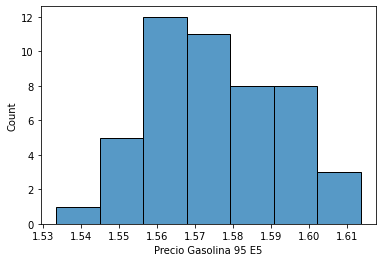

In [62]:
#Distrivución de los precios

sns.histplot(df_mapa["Precio Gasolina 95 E5"])

In [63]:
# Choropeth Gasolina

world_map = folium.Map(location = [40.18893909782826, -3.938873736090105], zoom_start = 6)

folium.Choropleth(geo_data     = geojson,
                  data         = df_mapa,
                  columns      = ["Provincia", "Precio Gasolina 95 E5"],
                  key_on       = "feature.properties.provincia",
                  fill_color   = "PuBuGn", 
                  fill_opacity = 0.7, 
                  line_opacity = 0.2,
                  legend_name  = "Precio Gasolina 95",
                  bins         = 253,
                  highlight    = True).add_to(world_map)

world_map

In [64]:
# Choropeth diesel

world_map = folium.Map(location = [40.18893909782826, -3.938873736090105], zoom_start = 6)

folium.Choropleth(geo_data     = geojson,
                  data         = df_mapa,
                  columns      = ["Provincia", "Precio Gasoleo A"],
                  key_on       = "feature.properties.provincia",
                  fill_color   = "PuBuGn", 
                  fill_opacity = 0.7, 
                  line_opacity = 0.2,
                  legend_name  = "Precio Gasoleo A",
                  bins         = 253,
                  highlight    = True).add_to(world_map)

world_map

### Diagrama de barras de la media de precios por provincia

In [65]:
px.bar(df_medias.sort_values("Precio Gasolina 95 E5",ascending=False),
       x          = "Provincia",
       y          = "Precio Gasolina 95 E5")


In [66]:
px.bar(df_medias.sort_values("Precio Gasoleo A",ascending=False),
       x          = "Provincia",
       y          = "Precio Gasoleo A")


### Mapa filtrado por provincia

In [67]:
def loc_gasolineras(data, color_p, color_s):
    for i, j, label, precio_gas, precio_diesel, horario, rot in zip(data["Latitud"], data["Longitud (WGS84)"], data["Dirección"], data["Precio Gasolina 95 E5"], data["Precio Gasoleo A"], data["Horario"], data["Rótulo"]): 

        gasolineras.add_child(folium.Marker(location     = [i, j],
                                            popup        = [f"Precio gasolina: {precio_gas}\n",
                                                            f"Precio diesel: {precio_diesel}\n",
                                                            f"Horario: {horario}\n",
                                                            rot,
                                                            label],
                                            icon         = folium.Icon(icon           = "fa-car",
                                                                       icon_color     = color_s,
                                                                       color          = color_p,
                                                                       prefix         = "fa")))
        

def loc_min_max(serie, color_p , color_s):
    
    lat = serie["Latitud"]
    long = serie["Longitud (WGS84)"]
    precio_gas = serie["Precio Gasolina 95 E5"]
    precio_diesel = serie["Precio Gasoleo A"]
    horario = serie["Horario"]
    rot =serie["Rótulo"]
    label = serie["Dirección"]
    
    gasolineras.add_child(folium.Marker(location     = [lat, long],
                                        popup        = [f"Precio gasolina: {precio_gas}\n",
                                                        f"Precio diesel: {precio_diesel}\n",
                                                        f"Horario: {horario}\n",
                                                        rot,
                                                        label],
                                        icon         = folium.Icon(icon             = "fa-car",
                                                                   icon_color       = color_s,
                                                                   color            = color_p,
                                                                   prefix           = "fa")))
    
        
def filtro_proveedor(data, proveedor):
    return data[(data["Rótulo"]==proveedor)]

def filtro_provincia(data, provincia):
    provincia = provincia.upper()
    return data[(data["Provincia"]== provincia)]

def filtro_municipio(data, provincia):
    provincia = provincia.title()
    return data[(data["Municipio"]== provincia)]

In [68]:
print(df_medias["Provincia"].values)

['BALEARS (ILLES)' 'BURGOS' 'ÁVILA' 'ASTURIAS' 'RIOJA (LA)' 'HUELVA'
 'CORUÑA (A)' 'CANTABRIA' 'ZAMORA' 'OURENSE' 'GIPUZKOA' 'NAVARRA'
 'ARABA/ÁLAVA' 'MÁLAGA' 'LEÓN' 'CUENCA' 'ALBACETE' 'PALENCIA' 'TERUEL'
 'PONTEVEDRA' 'LUGO' 'SEGOVIA' 'BIZKAIA' 'HUESCA' 'JAÉN' 'BADAJOZ'
 'VALENCIA / VALÈNCIA' 'SEVILLA' 'CASTELLÓN / CASTELLÓ' 'SALAMANCA'
 'GUADALAJARA' 'MADRID' 'GRANADA' 'CÁCERES' 'SORIA' 'TOLEDO' 'ALICANTE'
 'ALMERÍA' 'ZARAGOZA' 'MURCIA' 'CÁDIZ' 'BARCELONA' 'CÓRDOBA' 'VALLADOLID'
 'GIRONA' 'LLEIDA' 'CIUDAD REAL' 'TARRAGONA' 'PALMAS (LAS)'
 'SANTA CRUZ DE TENERIFE' 'CEUTA' 'MELILLA']


In [69]:
provincia = input("¿Qué provincia desea consutar? ")
provincia = provincia.upper()

lat = df_medias[df_medias["Provincia"]== provincia]["Latitud"].values[0]
long = df_medias[df_medias["Provincia"]== provincia]["Longitud (WGS84)"].values[0]

¿Qué provincia desea consutar? pontevedra


In [70]:
# Se extraen las carácteristicas de los cargadores electricos de la api de google maps

api_key = #Your Google Maps API_KEY

gmaps = googlemaps.Client(key = api_key)


params = {"query"     : "cargadores electricos",
         "location"   : [lat, long],
         "radius"     : 100,
         "page_token" : None}

token = None

places = gmaps.places(**params)

stop = False

data_places = list()

while stop == False:
    
    sleep(3)
    
    params = {"query"     : "cargadores electricos",
             "location"   : [lat, long],
             "radius"     : 100,
             "page_token" : token}
    
    places = gmaps.places(**params)
    
    for p in places["results"]:
    
        formatted_address = p["formatted_address"]
        lat = p["geometry"]["location"]["lat"]
        lng = p["geometry"]["location"]["lng"]
        name = p["name"]
        place_id = p["place_id"]
        rating = p["rating"]
        types = "|".join(p["types"])
        user_ratings_total = p["user_ratings_total"]

        data_places.append([formatted_address, lat, lng, name, place_id, rating, types, user_ratings_total])
        
    try:
        token = places["next_page_token"]
        
    except:
        stop = True
        
        

df_places = pd.DataFrame(data    = data_places,
                         columns = ["formatted_address", "lat", "lng", "name", "place_id",
                                     "rating", "types", "user_ratings_total"])

df_places

,formatted_address,lat,lng,name,place_id,rating,types,user_ratings_total
0,"Rúa Santa Clara, 4, 36002 Pontevedra, Spain",42.432687,-8.640869,Electric Vehicle Charging Station,ChIJda7OCKlxLw0RTTVwKvuzUSw,5.0,point_of_interest|establishment,2
1,"Av. Encoirados, 3, 36163 Poio, Pontevedra, Spain",42.436578,-8.673807,Electric Vehicle Charging Station,ChIJuXRxJVFvLw0RHukf7iTcvBY,5.0,point_of_interest|establishment,1
2,"Ctra. De Madrid, 210, 36318 Vigo, Pontevedra, ...",42.214188,-8.673471,Allego Charging Station,ChIJC2leixqIJQ0ReIkEa1rQZTM,0.0,point_of_interest|establishment,0
3,"Av. Sta. Mariña, 86, 36800 Redondela, Ponteved...",42.290166,-8.607808,Electric Vehicle Charging Station,ChIJLaDz0iF9Lw0R01j0xatdJb8,0.0,point_of_interest|establishment,0
4,"Rúa das Pontes, 4, 36350 Nigrán, Pontevedra, S...",42.132870,-8.795249,Iberdrola Charging Station,ChIJE3rdq4GMJQ0RMqjXCF2kJmY,4.0,point_of_interest|establishment,2
5,"Av. de Madrid, 124, 36214 Vigo, Pontevedra, Spain",42.220243,-8.706176,Iberdrola Charging Station,ChIJtUgffdWJJQ0R9qBcgGXs4Xg,2.0,point_of_interest|establishment,1
6,ESTACIÓN DE SERVICIO ANDURIÑA - Cepsa Sanjenjo...,42.411150,-8.813658,Endesa X Charging Station,ChIJxdENjbVpLw0Rj8msvuGwV6U,1.0,point_of_interest|establishment,4
7,"25 Lugar de, Lugar Padriñan, 25, 36960 Sanxenx...",42.405112,-8.805932,Tesla Destination Charger,ChIJrcG2sk1oLw0RRZ6E6P7CR10,5.0,point_of_interest|establishment,3
8,"15948 A Pobra do Caramiñal, A Coruña, Spain",42.607862,-8.963989,Electric Vehicle Charging Station,ChIJ20-DDF07Lw0RIE_5uta6bMo,4.0,point_of_interest|establishment,1
9,"Rúa Travesía de Vigo, 202, 36207 Vigo, Ponteve...",42.243430,-8.696053,Electric Vehicle Charging Station,ChIJK8z6yX1jLw0RJylZUMh92zg,0.0,point_of_interest|establishment,0


In [71]:
df_provincia = filtro_provincia(df, provincia)

In [72]:
#Series de la gasolinera más cara y mas barata

df_min = df_provincia.sort_values('Precio Gasolina 95 E5').iloc[1]
df_max = df_provincia.sort_values('Precio Gasolina 95 E5', ascending=False).iloc[1]

In [73]:
df_repsol = filtro_proveedor(df_provincia, "REPSOL")
df_cepsa = filtro_proveedor(df_provincia, "CEPSA")
df_bp = filtro_proveedor(df_provincia, "BP")


#Obtenemos el mapa de la provincia
mapa = folium.Map(location = [lat, long], zoom_start = 9)

# Inicializamos un FeatureGroup() para las gasolineras en el DataFrame
gasolineras = folium.map.FeatureGroup()

loc_gasolineras(df_provincia, "blue", "white")
loc_gasolineras(df_repsol, "blue", "orange")
loc_gasolineras(df_cepsa, "blue", "red")
loc_gasolineras(df_bp, "blue", "green")
loc_min_max(df_min, "green", "white")
loc_min_max(df_max, "red", "white")


for lat, lng, label, rating in zip(df_places["lat"], df_places["lng"], df_places["name"], df_places["rating"]):

    gasolineras.add_child(folium.Marker(location       = [lat, lng],
                                        popup          = [label, f"Puntuación: {rating}"],
                                        icon           = folium.Icon(icon = "fa-plug",
                                        icon_color     = "white",
                                        color          = "lightgreen",
                                        prefix         = "fa")))



# Agrega gasolineras al mapa
mapa.add_child(gasolineras)


# Coche Naranja: Repsol
# Coche Rojo: Cepsa
# Coche Verde: BP
# Icono Verde: Gasolinera con la gasolina más barata
# Icono Rojo: Gasolinera con la gasolina más cara
# Icono Verde claro con enchufe: Cargadores de coches eléctricos

In [74]:
mapa

# Comparativa GLP - GNL

In [78]:
df_glp = df[(pd.isnull(df["Precio Gases licuados del petróleo"])==False)]
df_glp = filtro_provincia (df_glp, provincia)
df_glp

,C.P.,Dirección,Horario,Latitud,Localidad,Longitud (WGS84),Municipio,Precio Biodiesel,Precio Bioetanol,Precio Gas Natural Comprimido,...,Precio Hidrogeno,Provincia,Rótulo,Tipo Venta,% BioEtanol,% Éster metílico,IDEESS,IDMunicipio,IDProvincia,IDCCAA
5,36994,"AVENIDA ENCOIRADOS, S/N",L-D: 07:00-23:00,42.436472,POIO,-8.673583,Poio,NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",344,5305,36,12
527,36940,"CARRETERA PO-551 KM. 15,4",L-D: 07:00-23:00,42.289444,CANGAS,-8.784722,Cangas,NaN,NaN,NaN,...,None,PONTEVEDRA,CEPSA,P,"0,0","0,0",720,5275,36,12
1324,36528,"CARRETERA PO-840 KM. 67,300",L-D: 07:00-23:00,42.774083,MARCELIN,-8.026028,Agolada,NaN,NaN,NaN,...,None,PONTEVEDRA,SHELL,P,"0,0","0,0",12533,5267,36,12
1867,36143,"CR N-550, 126,4",L-D: 07:00-23:00,42.398417,SALCEDO (SAN MARTIÑO),-8.636361,Pontevedra,NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",754,5309,36,12
2464,36720,"CTRA. NACIONAL 550, KM. 167,2",L-D: 24H,42.069528,PUENTE NUEVO,-8.631472,Tui,NaN,NaN,NaN,...,None,PONTEVEDRA,SERTUY,P,"0,0","0,0",295,5322,36,12
2855,36880,CARRETERA CARRETERA CAÑIZA - CRECIENTE S/N KM....,L-D: 24H,42.207083,CAÑIZA (A),-8.267611,Cañiza (A),NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",336,5276,36,12
3668,36350,"RUA DAS PONTES-POL INDUSTRIAL PORTO DO MOLLE, S/N",L-D: 06:30-22:30,42.134056,OUTEIRO,-8.796333,Nigrán,NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",14670,5302,36,12
4946,36500,"AVENIDA BUENOS AIRES, 0",L-D: 07:00-23:00,42.655056,LALIN,-8.111722,Lalín,NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",788,5291,36,12
5895,36141,"AU A-9, 144",L-D: 24H,42.317667,VILABOA,-8.662222,Vilaboa,NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",814,5326,36,12
7586,36204,"AVENIDA DE MADRID, 66",L-D: 07:00-23:00,42.224583,VIGO,-8.711444,Vigo,NaN,NaN,NaN,...,None,PONTEVEDRA,REPSOL,P,"0,0","0,0",716,5324,36,12


In [79]:
# Volvemos a inicializar el mapa
sf_map = folium.Map(location = [lat, long], zoom_start = 9)

# Inicializamos un FeatureGroup() 
gnls = folium.map.FeatureGroup()



for i, j, label, df_glp, horario, rot in zip(df_glp["Latitud"], df_glp["Longitud (WGS84)"], df_glp["Dirección"], df_glp["Precio Gases licuados del petróleo"], df_glp["Horario"], df_glp["Rótulo"]): 

    
    gnls.add_child(folium.Marker(location     = [i,j],
                                 popup        = [f"Precio GLP: {df_glp}\n",
                                                 f"Horario: {horario}\n",
                                                 rot,
                                                 label],
                                  icon         = folium.Icon(icon           = "fa-car",
                                                             icon_color     = "white",
                                                             color          = "black",
                                                             prefix         = "fa")))
    

sf_map.add_child(gnls)

sf_map

In [81]:
df_gnl = df[(pd.isnull(df["Precio Gas Natural Licuado"])==False)]

In [82]:
# Volvemos a inicializar el mapa
sf_map = folium.Map(location = [lat, long], zoom_start = 9)

# Inicializamos un FeatureGroup() 
gnls = folium.map.FeatureGroup()



for i, j, label, df_gnl, horario, rot in zip(df_gnl["Latitud"], df_gnl["Longitud (WGS84)"], df_gnl["Dirección"], df_gnl["Precio Gas Natural Licuado"], df_gnl["Horario"], df_gnl["Rótulo"]): 

    
    gnls.add_child(folium.Marker(location     = [i,j],
                                 popup        = [f"Precio GNL: {df_gnl}\n",
                                                 f"Horario: {horario}\n",
                                                 rot,
                                                 label],
                                  icon         = folium.Icon(icon           = "fa-car",
                                                             icon_color     = "white",
                                                             color          = "lightgray",
                                                             prefix         = "fa")))
    

sf_map.add_child(gnls)

sf_map

In [83]:
##################################################################################################################